# EDA

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
df_d = pd.read_csv("DailyDataset.csv", index_col=0)
df_h = pd.read_csv("HourlyDataset.csv", index_col=0)
df_d = df_d.set_index('Date')
df_h = df_h.set_index('Date')

In [3]:
df_d.isna().sum()

Return                        0
Return-7                      0
Return+1                      0
Return-30                     0
target_multi                  0
target_bin                    0
Month                         0
DayOfW                        0
Return_eth                    0
Return_bnb                    0
Return_ada                    0
Return_lite                   0
Trend_Bitcoins                0
R_eth                         0
R_bnb                         0
R_ada                         0
R_lite                        0
avg-block-size              624
cost-per-transaction        624
hash-rate                   624
miners-revenue              624
mvrv                        624
my-wallet-n-users           624
n-transactions-per-block    624
nvt                         624
transaction-fees-usd        624
dtype: int64

In [4]:
df_h.isna().sum()

Return                      0
Return-7                    0
Return-30                   0
Return+1                    0
target_multi                0
target_bin                  0
Month                       0
DayOfW                      0
Return_eth                  0
Return_bnb                  0
Return_ada                  0
Return_lite                 0
btc                         0
R_eth                       0
R_bnb                       0
R_ada                       0
R_lite                      0
Synch_lite                  0
Synch_eth                   0
Synch_bnb                   0
Synch_ada                   0
avg-block-size              0
cost-per-transaction        0
hash-rate                   0
miners-revenue              0
mvrv                        0
my-wallet-n-users           0
n-transactions-per-block    0
nvt                         0
transaction-fees-usd        0
dtype: int64

#### Label distribution

In [12]:
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{"type": "pie"}, {"type": "pie"}],
           [{"type": "pie"}, {"type": "pie"}]],
    horizontal_spacing = 0.05,
    vertical_spacing = 0.07,
)

fig.add_trace(go.Pie(values=df_d['target_bin'].value_counts().values, title="Daily dataset - Binary label"),
              row=1, col=1)

fig.add_trace(go.Pie(values=df_h['target_bin'].value_counts().values, title="Hourly dataset - Binary label"),
              row=2, col=1)

fig.add_trace(go.Pie(values=df_d['target_multi'].value_counts().values, title="Daily dataset - Multi label"),
              row=1, col=2)

fig.add_trace(go.Pie(values=df_h['target_multi'].value_counts().values, title="Hourly dataset - Multi label"),
              row=2, col=2)

fig.update_layout(height=700)
fig.update_layout(title_text='Repartition of labels')
fig.show()

#### Return

In [39]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Daily dataset',  'Hourly dataset'),
    specs=[[{"type": "scatter"}],
           [{"type": "scatter"}]],
)
fig.add_trace(go.Scatter(x=df_d.index, y=df_d['Return'],
                    mode='lines',
                    name='lines'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=df_h.index, y=df_h['Return'],
                    mode='lines',
                    name='lines'),
              row=2, col=1)

fig.update_layout(height=700)
fig.update_layout(showlegend=False)
fig.update_layout(title_text='Return of Bitcoin')

fig.show()

In [40]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Daily dataset',  'Hourly dataset'),
    specs=[[{"type": "scatter"}],
           [{"type": "scatter"}]],
)
fig.add_trace(go.Scatter(x=df_d.index, y=df_d['Return_eth'],
                    mode='lines',
                    name='lines'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=df_h.index, y=df_h['Return_eth'],
                    mode='lines',
                    name='lines'),
              row=2, col=1)

fig.update_layout(height=700)
fig.update_layout(showlegend=False)
fig.update_layout(title_text='Return of Ether')

fig.show()

#### Correlation

In [41]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Daily dataset',  'Hourly dataset'),
    specs=[[{"type": "scatter"}],
           [{"type": "scatter"}]],
)
fig.add_trace(go.Scatter(x=df_d.index, y=df_d['R_eth'],
                    mode='lines',
                    name='lines'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=df_h.index, y=df_h['R_eth'],
                    mode='lines',
                    name='lines'),
              row=2, col=1)

fig.update_layout(height=700)
fig.update_layout(showlegend=False)
fig.update_layout(title_text='Correlation of ETH on BTC in window of 3 value')

fig.show()

In [42]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Daily dataset',  'Hourly dataset'),
    specs=[[{"type": "scatter"}],
           [{"type": "scatter"}]],
)
fig.add_trace(go.Scatter(x=df_d.index, y=df_d['R_bnb'],
                    mode='lines',
                    name='lines'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=df_h.index, y=df_h['R_bnb'],
                    mode='lines',
                    name='lines'),
              row=2, col=1)

fig.update_layout(height=700)
fig.update_layout(showlegend=False)
fig.update_layout(title_text='Correlation of ETH on BTC in window of 3 value')

fig.show()

#### Crypto Synchrony (Hourly Dataset only)

In [43]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Synch_bnb',  'Synch_eth'),
    specs=[[{"type": "scatter"}],
           [{"type": "scatter"}]],
)
fig.add_trace(go.Scatter(x=df_h.index, y=df_h['Synch_bnb'],
                    mode='lines',
                    name='lines'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=df_h.index, y=df_h['Synch_eth'],
                    mode='lines',
                    name='lines'),
              row=2, col=1)

fig.update_layout(height=700)
fig.update_layout(showlegend=False)
fig.update_layout(title_text='Synchrony of BNB and ETH on BTC')

fig.show()

#### Day Return repartition

In [44]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Month',  'Day of the Week'),
    specs=[[{"type": "box"}],
           [{"type": "box"}]],
    horizontal_spacing = 0.05,
    vertical_spacing = 0.07
)
fig.add_trace(go.Box(x=df_d["Month"], y=df_d["Return"]), row=1, col=1)
fig.add_trace(go.Box(x=df_d["DayOfW"], y=df_d["Return"]), row=2, col=1)

fig.update_layout(height=700)
fig.update_layout(showlegend=False)
fig.update_layout(title_text='Impact of Date on Return - Daily Dataset')
fig.show()

In [45]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=('Month',  'Day of the Week'),
    specs=[[{"type": "box"}],
           [{"type": "box"}]],
    horizontal_spacing = 0.05,
    vertical_spacing = 0.07
)
fig.add_trace(go.Box(x=df_h["Month"], y=df_h["Return"]), row=1, col=1)
fig.add_trace(go.Box(x=df_h["DayOfW"], y=df_h["Return"]), row=2, col=1)

fig.update_layout(height=700)
fig.update_layout(showlegend=False)
fig.update_layout(title_text='Impact of Date on Return - Hourly Dataset')
fig.show()

#### Correlation Matrix

##### Pearson

Text(0.5, 1.0, 'Correlation Heatmap - Daily dataset')

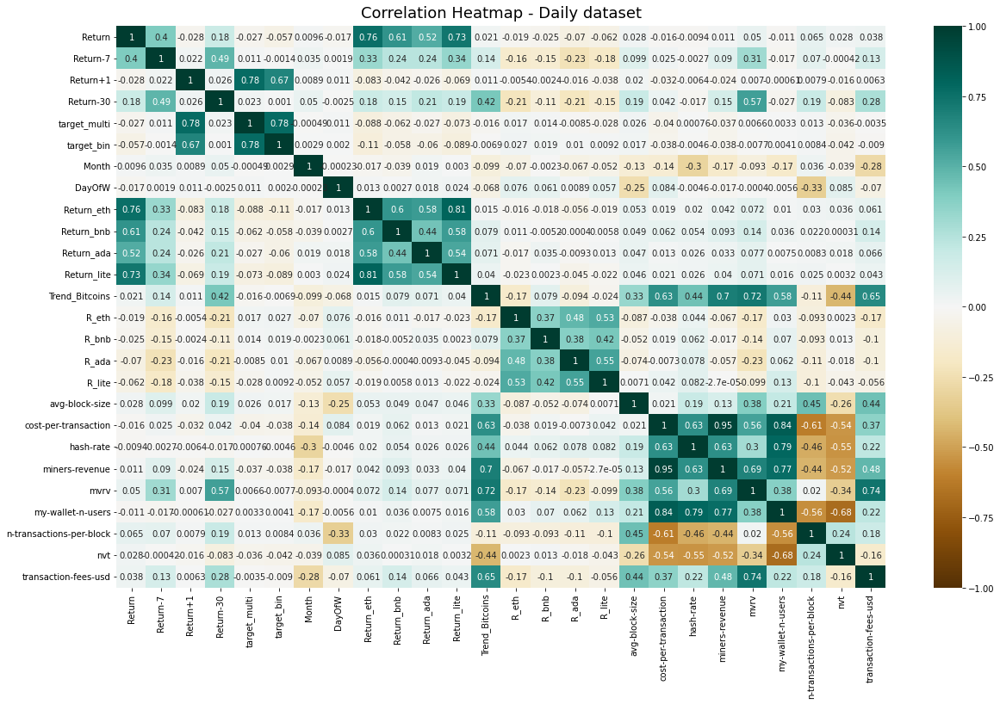

In [46]:
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(df_d.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap - Daily dataset', fontdict={'fontsize':18}, pad=10)

Text(0.5, 1.0, 'Correlation Heatmap - Hourly dataset')

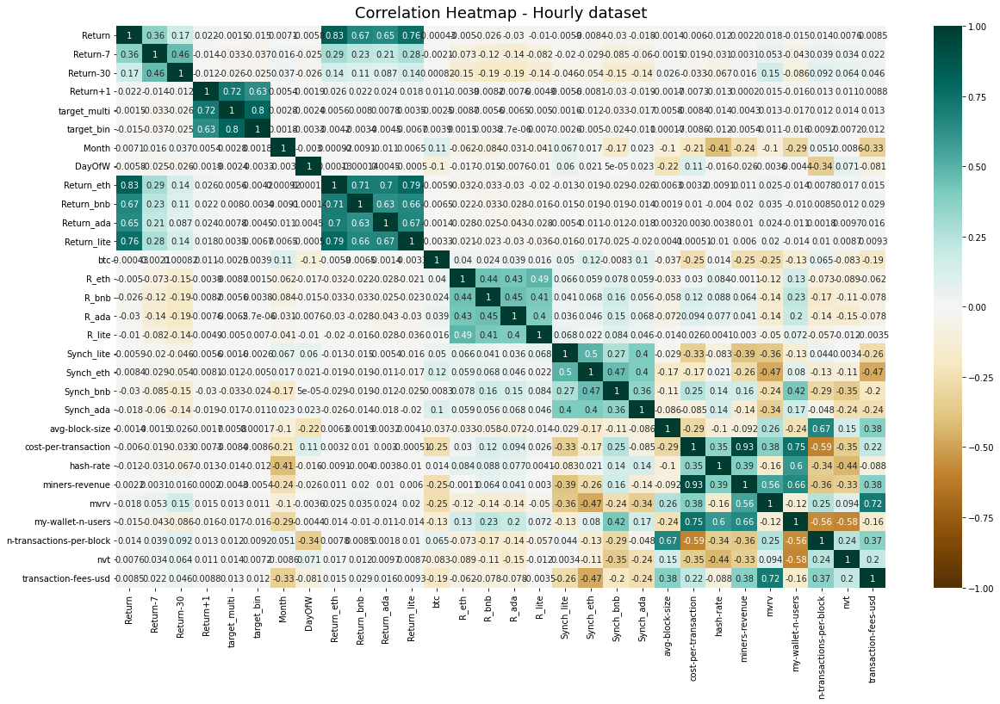

In [47]:
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(df_h.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap - Hourly dataset', fontdict={'fontsize':18}, pad=10)

##### Spearman

Text(0.5, 1.0, 'Correlation Heatmap - Hourly dataset')

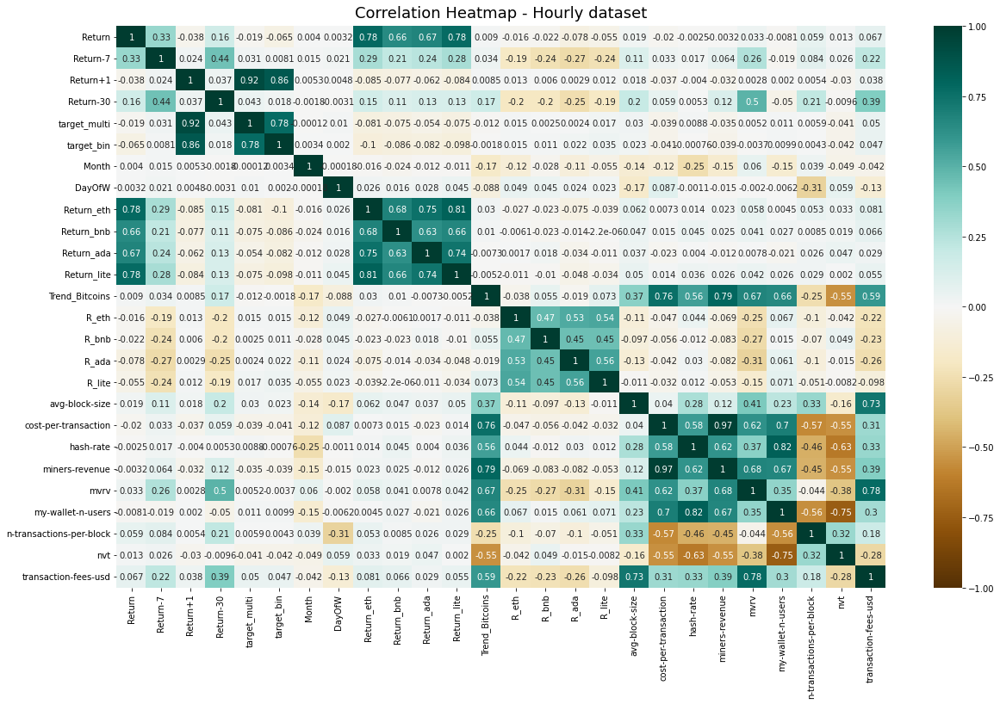

In [51]:
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(df_d.corr(method='spearman'), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap - Hourly dataset', fontdict={'fontsize':18}, pad=10)

Text(0.5, 1.0, 'Correlation Heatmap - Hourly dataset')

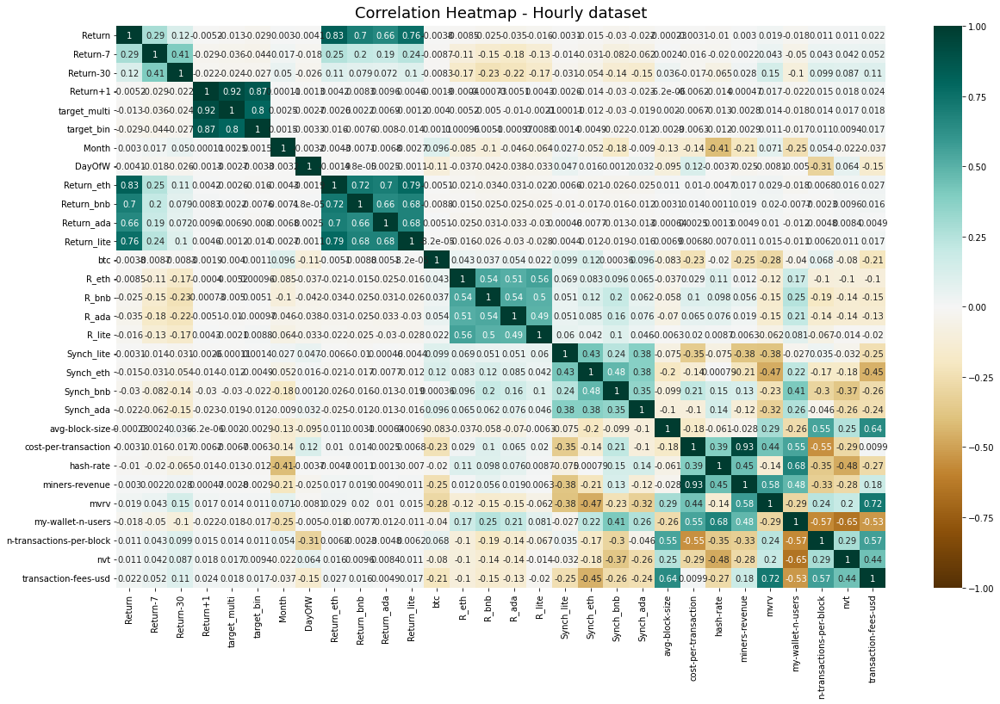

In [48]:
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(df_h.corr(method='spearman'), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap - Hourly dataset', fontdict={'fontsize':18}, pad=10)

#### Correlation of ETH on BTC per next Return

In [49]:
fig = px.scatter(x=df_h["R_eth"], y=df_h["Return"], color=df_h["target_multi"])
fig.show()

#### Synchrony of ETH on BTC per next Return

In [50]:
fig = px.scatter(x=df_h["Synch_eth"], y=df_h["Return+1"], color=df_h["target_multi"])
fig.show()